### ΑΜ: 1115201700119   Θωμάς Παπαθυμιόπουλος
### ΑΜ: 1115201700102   Ιωάννης Νάνας

## Περιγραφή

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

pd.options.mode.chained_assignment = None  

Ανάγνωση άρθρων, διαχωρισμός σε title, content και ανάθεση id, category.

In [2]:
id_count = 0
#pre_set = pd.DataFrame(columns=['Id', 'Title', 'Content', 'Category'])
pre_set = []
for root, dirs, files in os.walk('./fulltext/data'):
    for dir in dirs:
        entries = os.listdir('%s/%s'%(root, dir))
        for file in entries:
            if file.endswith('.txt'):
                with open(os.path.join(root+ '/' + dir, file), 'r') as f:
                    text = f.read()
                    text = text.split('\n', 1)
                    text[1] = text[1].replace("\n","")
                    pre_set.append([id_count, text[0], text[1], dir])
                    id_count += 1

Διαχωρισμός άρθρων σε train, test.

In [3]:
train_set, test_set = train_test_split(pre_set, test_size=0.2)

Μετατροπή λιστών σε dataframe.

In [4]:
#converting list to dataframe
train_set = pd.DataFrame(train_set, columns=["Id", "Title", "Content", "Category"])
test_set = pd.DataFrame(test_set, columns=["Id", "Title", "Content", "Category"])
#test_set = test_set.drop(columns=["Category"])

Γραφή των dataframe στη μνήμη σε μορφή tsv.

In [5]:
train_set.to_csv('train_set.tsv', sep = '\t', index=False)
test_set.to_csv('test_set.tsv', sep = '\t', index=False)

## Ερώτημα 1

Ανάγνωση του train.tsv σε dataframe.

In [6]:
train_set = pd.read_csv('train_set.tsv', sep='\t', header=0)

Παραγωγή wordcloud για κάθε κατηγορία άρθρων του train με δημιουργεία bow.

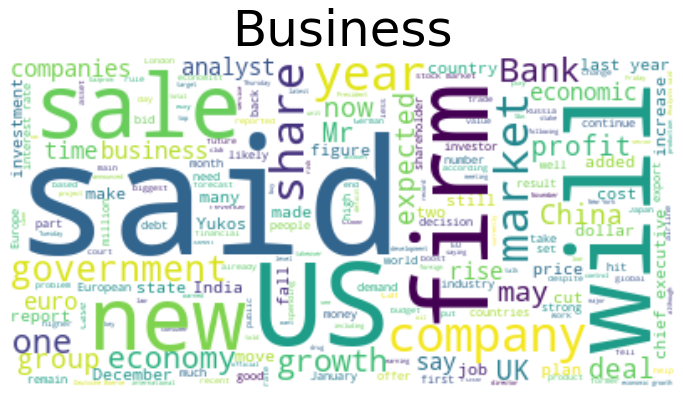

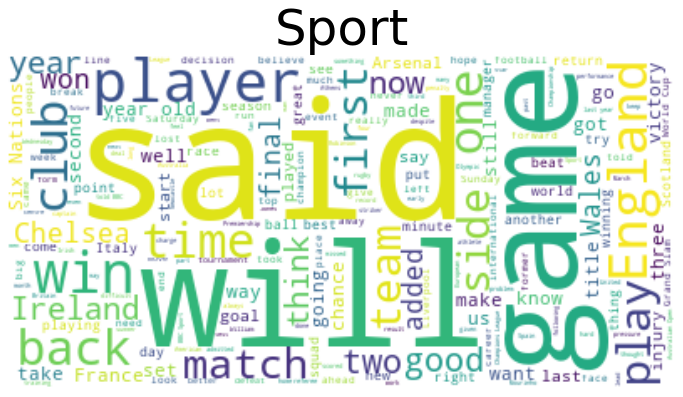

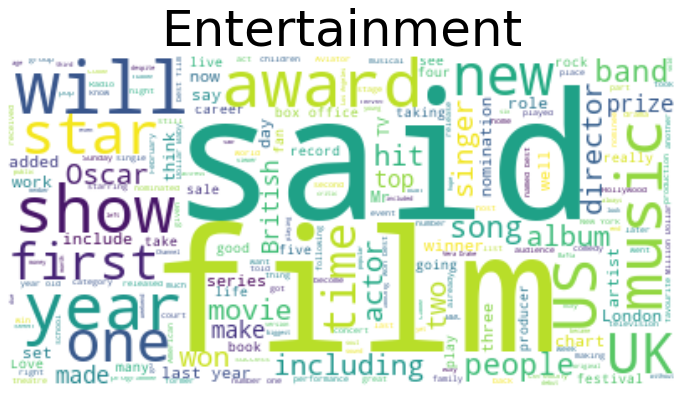

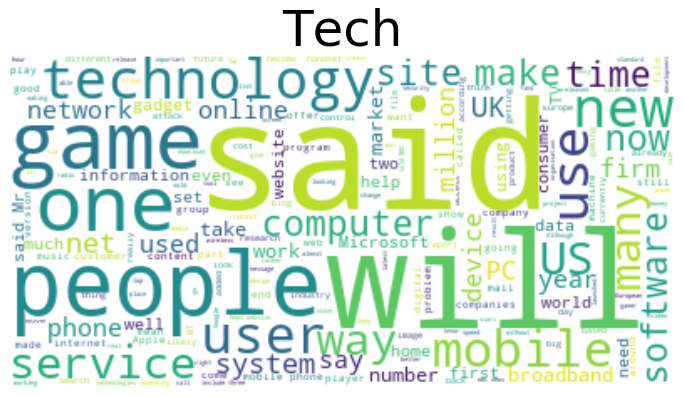

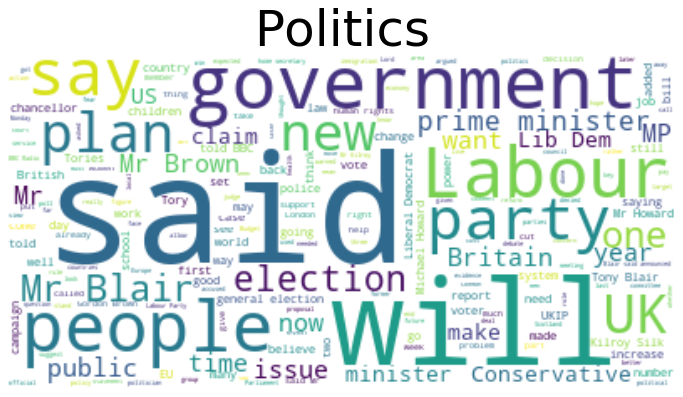

In [7]:
categs = pd.unique(train_set.Category)
for i in categs:
    temp = train_set[train_set.Category == i]
    temp["Union"] = temp.Title + " " + temp.Content
    bag = " ".join(x for x in temp.Union)
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color='white').generate(bag)
    # Display the generated image:
    plt.figure(figsize=(12,8))
    plt.title(i.capitalize(),fontsize=50)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

## Ερώτημα 2 & 3

Απαραίτητα imports και επιλογή των στηλών content σε lowercase για κάθε άρθρο στα train.tsv και test.tsv.

In [8]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer, TfidfVectorizer
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
import sklearn.metrics as metrics
import scikitplot as skplt
from sklearn.metrics import plot_roc_curve
from sklearn import preprocessing
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
from sklearn.tree import DecisionTreeClassifier


train_set = pd.read_csv('train_set.tsv', sep='\t', header=0)
test_set = pd.read_csv('test_set.tsv', sep='\t', header=0)
tempTrain = train_set[['Category', 'Content']]
tempTrain['Content'] = tempTrain['Content'].str.lower()
tempTest = test_set[['Content', 'Category']]
tempTest['Content'] = tempTest['Content'].str.lower()

Συνάρτηση που επιστρέφει τα macro fpr, tpr και auc για multiclass.

In [9]:
def getMulticlassAverage(clf, X_train, y_train, X_test, y_test):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)

    y_test = lb.transform(y_test)
    y_score = clf.predict_proba(X_test)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(5):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(5)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(5):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= 5

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    return [fpr["macro"], tpr["macro"], roc_auc["macro"]]

Συνάρτηση που δημιουργέι roc plot για multiclass.

In [10]:
def makeROCplot(clf, X_train, y_train, X_test, y_test, y_pred):
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_test)

    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    y_score = clf.predict_proba(X_test)

    plt.figure(figsize = (10,8))

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(5):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    colors = ['blue', 'red', 'green', 'yellow', 'pink']
    for i, color in zip(range(5), colors):
        plt.plot(fpr[i], tpr[i], color=color,
                label='ROC curve of class {0} (area = {1:0.3f})'
                ''.format(i, roc_auc[i]))

    # print(roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for multi-class data')
    plt.legend(loc="lower right")
    plt.show()

Συνάρτηση που δημιουργεί average roc plot για 10-fold cross validation.

In [11]:
from sklearn.model_selection import KFold, train_test_split, RandomizedSearchCV, StratifiedKFold
from scipy import interp

def makeAverageRocPlot(classifier, X, y_og):
        y = y_og[:]
        cv = StratifiedKFold(n_splits=10)
        plt.figure(figsize = (10,8))

        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        i = 0
        for train, test in cv.split(X, y):
                stats = getMulticlassAverage(classifier, X[train], y[train], X[test], y[test])  
                fpr = stats[0]
                tpr = stats[1]
                roc_auc = stats[2]
                
                tprs.append(interp(mean_fpr, fpr, tpr))
                tprs[-1][0] = 0.0
                roc_auc = auc(fpr, tpr)
                aucs.append(roc_auc)
                plt.plot(fpr, tpr, lw=1, alpha=0.3,
                        label='ROC fold %d (AUC = %0.3f)' % (i, roc_auc))

                i += 1
        
        plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
                label='Luck', alpha=.8)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr, mean_tpr, color='b',
                label=r'Mean ROC (AUC = %0.3f $\pm$ %0.3f)' % (mean_auc, std_auc),
                lw=2, alpha=.8)

        std_tpr = np.std(tprs, axis=0)
        tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
        tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
        plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                        label=r'$\pm$ 1 std. dev.')

        plt.xlim([-0.05, 1.05])
        plt.ylim([-0.05, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver operating characteristic example')
        plt.legend(loc="lower right")
        plt.show()

### SVM
Συνάρτηση για classification με SVM classifier και αξιολόγηση της με τις ζητούμενες μεθόδους. Γίνεται χρήση pipeline για την διαχείρηση των text τύπου δεδομένων. Αρχικά με count vectorizer και έπειτα για tfidf vectorizer. Η αξιολόγηση γίνεται με cross validation. Η grid search είναι σχολιασμένη για λόγους χρόνου κατά την εκτέλεση. 

Count
Precision:  0.958
Recall:  0.956
F1:  0.956
Accuracy:  0.956


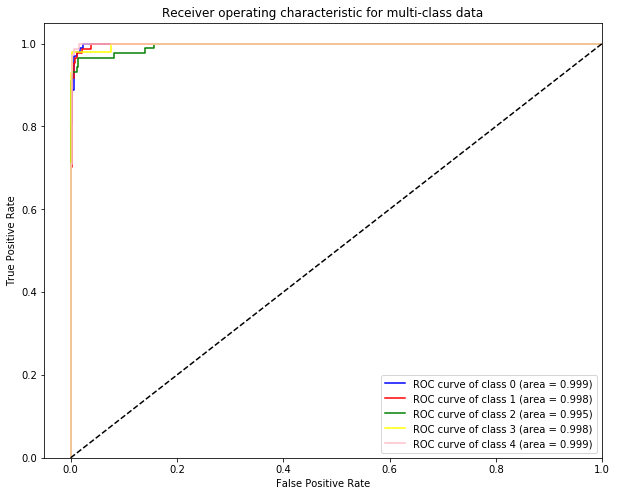

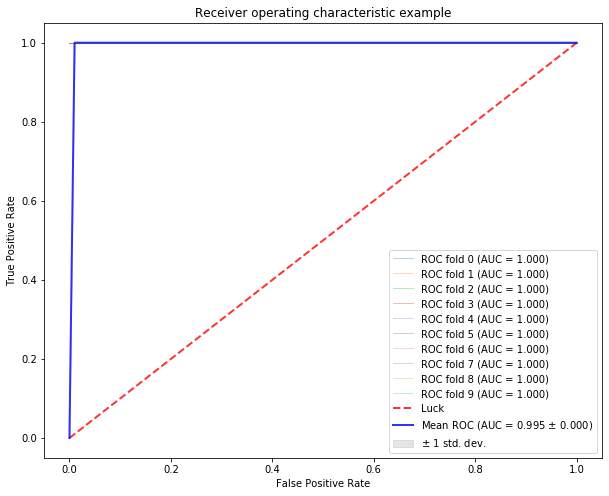

Tfidf
Precision:  0.975
Recall:  0.974
F1:  0.974
Accuracy:  0.974


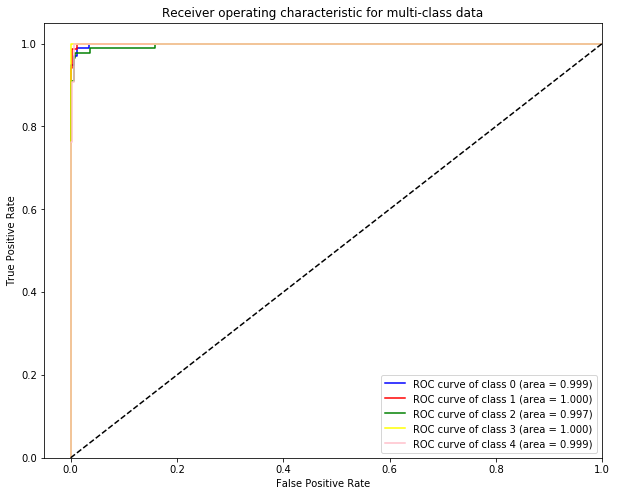

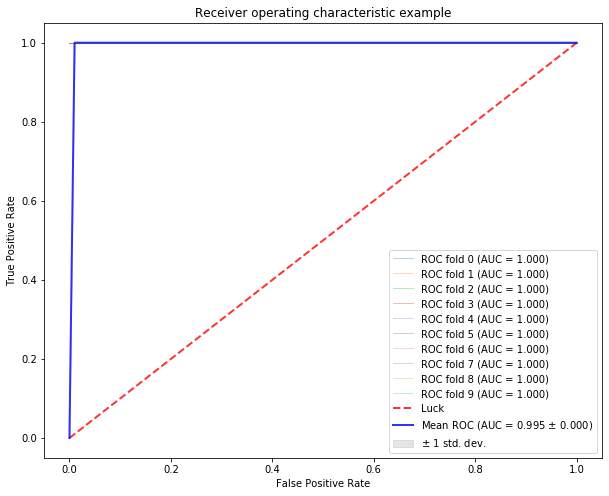

In [12]:
from sklearn.svm import SVC

def mySVM(train, test):
    scoring = {'precision_weighted', 'recall_weighted', 'f1_weighted', 'accuracy'}

    text_clf_svm = Pipeline([('vect', CountVectorizer()), ('clf-svm', SVC(kernel = 'rbf', gamma='scale', C=10, probability=True))])
    #parameters = {'clf-svm__C': [1], 'clf-svm__gamma': [1e-3, 1e-4], 'clf-svm__kernel': ['rbf']}
    #grid_search = GridSearchCV(text_clf_svm, parameters, n_jobs=-1, verbose=0)
    cv_scores = cross_validate(text_clf_svm, train.Content, train.Category, cv=10, scoring=scoring)
    print('Count')
    print('Precision: ' ,np.mean(cv_scores['test_precision_weighted']).round(3))
    print('Recall: ' ,np.mean(cv_scores['test_recall_weighted']).round(3))
    print('F1: ' ,np.mean(cv_scores['test_f1_weighted']).round(3))
    print('Accuracy: ' ,np.mean(cv_scores['test_accuracy']).round(3))
    #grid_search.fit(train.Content, train.Category)
    text_clf_svm.fit(train.Content, train.Category)
    count_predictions = text_clf_svm.predict(test.Content)

    makeROCplot(text_clf_svm, train.Content, train.Category, test.Content, test.Category, count_predictions)
    makeAverageRocPlot(text_clf_svm, train.Content, train.Category)

    text_clf_svm = Pipeline([('vect', CountVectorizer()), ('tfidf', TfidfTransformer()), ('clf-svm', SVC(kernel = 'rbf', gamma='scale', C=10, probability=True))])
    #parameters = {'clf-svm__C': [1], 'clf-svm__gamma': [1e-3, 1e-4], 'clf-svm__kernel': ['rbf']}
    #grid_search = GridSearchCV(text_clf_svm, parameters, n_jobs=-1, verbose=0)
    cv_scores = cross_validate(text_clf_svm, train.Content, train.Category, cv=10, scoring=scoring)
    print('Tfidf')
    print('Precision: ' ,np.mean(cv_scores['test_precision_weighted']).round(3))
    print('Recall: ' ,np.mean(cv_scores['test_recall_weighted']).round(3))
    print('F1: ' ,np.mean(cv_scores['test_f1_weighted']).round(3))
    print('Accuracy: ' ,np.mean(cv_scores['test_accuracy']).round(3))
    #grid_search.fit(train.Content, train.Category)
    text_clf_svm.fit(train.Content, train.Category)
    tfidif_predictions = text_clf_svm.predict(test.Content)

    makeROCplot(text_clf_svm, train.Content, train.Category, test.Content, test.Category, tfidif_predictions)
    makeAverageRocPlot(text_clf_svm, train.Content, train.Category)

mySVM(tempTrain, tempTest)    

### NB
Συνάρτηση για classification με Naive Bayes classifier και αξιολόγηση της με τις ζητούμενες μεθόδους. Γίνεται χρήση pipeline για την διαχείρηση των text τύπου δεδομένων. Αρχικά με count vectorizer και έπειτα για tfidf vectorizer. Η αξιολόγηση γίνεται με cross validation.

Count
Precision:  0.976
Recall:  0.975
F1:  0.975
Accuracy:  0.975


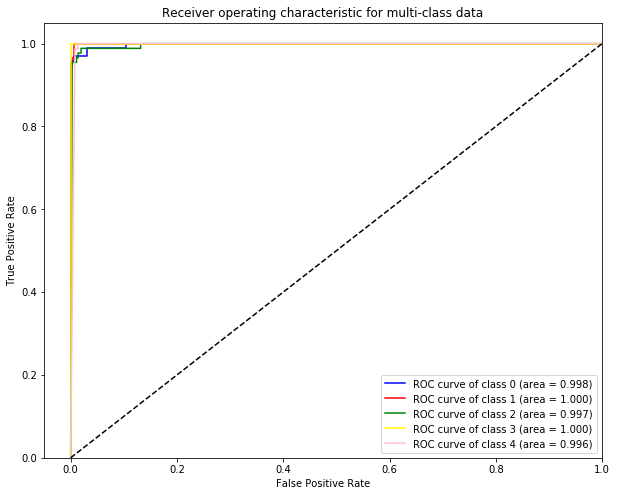

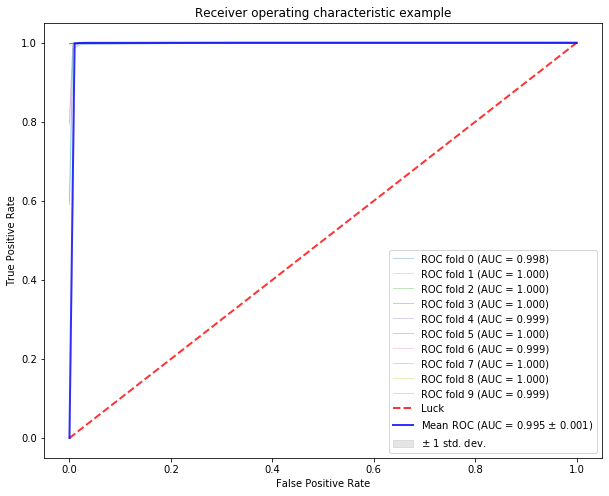

Tfidf
Precision:  0.947
Recall:  0.944
F1:  0.942
Accuracy:  0.944


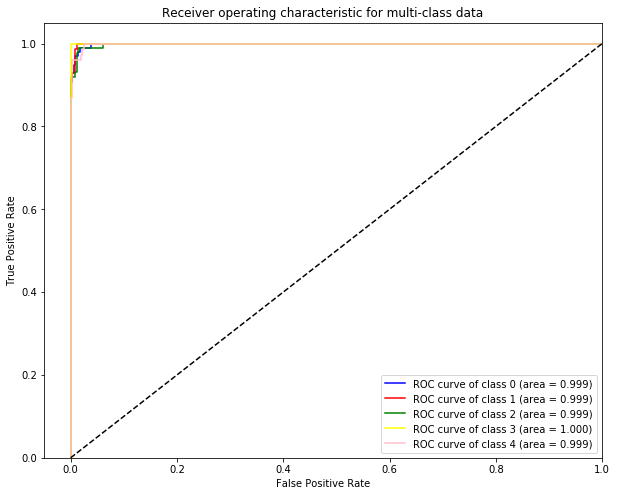

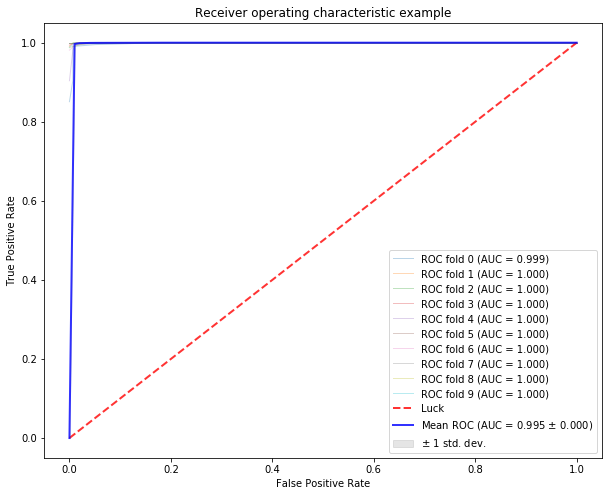

In [13]:
from sklearn.naive_bayes import MultinomialNB

def myNB(train, test):
    scoring = {'precision_weighted', 'recall_weighted', 'f1_weighted', 'accuracy'}

    text_clf = Pipeline([('vect', CountVectorizer()), ('clf', MultinomialNB())])
    cv_scores = cross_validate(text_clf, train.Content, train.Category, cv=10, scoring=scoring)

    print('Count')
    print('Precision: ' ,np.mean(cv_scores['test_precision_weighted']).round(3))
    print('Recall: ' ,np.mean(cv_scores['test_recall_weighted']).round(3))
    print('F1: ' ,np.mean(cv_scores['test_f1_weighted']).round(3))
    print('Accuracy: ' ,np.mean(cv_scores['test_accuracy']).round(3))
    text_clf = text_clf.fit(train.Content, train.Category)
    count_predictions = text_clf.predict(test.Content)   

    makeROCplot(text_clf, train.Content, train.Category, test.Content, test.Category, count_predictions)
    makeAverageRocPlot(text_clf, train.Content, train.Category)

    text_clf = Pipeline([('vect', CountVectorizer()), ('tfidf', TfidfTransformer()), ('clf', MultinomialNB())])
    cv_scores = cross_validate(text_clf, train.Content, train.Category, cv=10, scoring=scoring)
    
    print('Tfidf')
    print('Precision: ' ,np.mean(cv_scores['test_precision_weighted']).round(3))
    print('Recall: ' ,np.mean(cv_scores['test_recall_weighted']).round(3))
    print('F1: ' ,np.mean(cv_scores['test_f1_weighted']).round(3))
    print('Accuracy: ' ,np.mean(cv_scores['test_accuracy']).round(3))
    text_clf = text_clf.fit(train.Content, train.Category)
    tfidif_predictions = text_clf.predict(test.Content)

    makeROCplot(text_clf, train.Content, train.Category, test.Content, test.Category, tfidif_predictions)
    makeAverageRocPlot(text_clf, train.Content, train.Category)

   

myNB(tempTrain, tempTest)

### Random Forest
Συνάρτηση για classification με SVM classifier και αξιολόγηση της με τις ζητούμενες μεθόδους. Γίνεται χρήση pipeline για την διαχείρηση των text τύπου δεδομένων. Αρχικά με count vectorizer και έπειτα για tfidf vectorizer. Η αξιολόγηση γίνεται με cross validation.

Count
Precision:  0.961
Recall:  0.959
F1:  0.959
Accuracy:  0.959


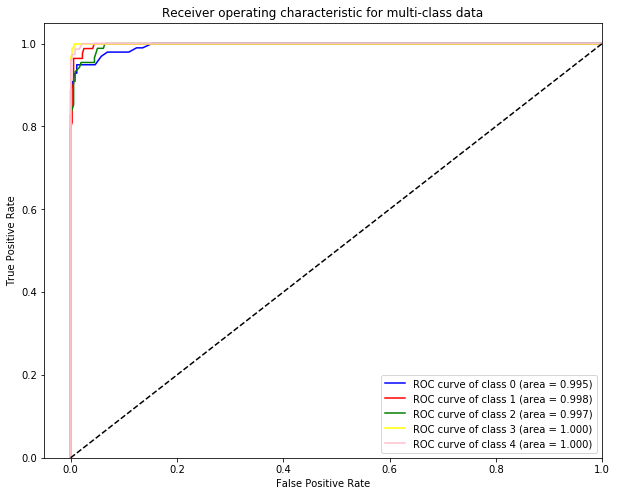

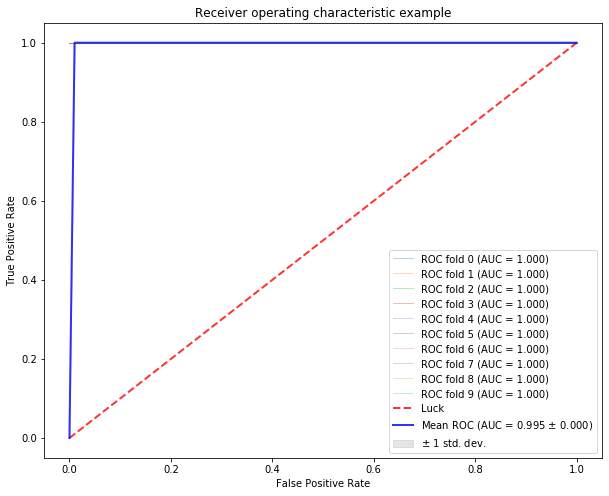

Tfidf
Precision:  0.954
Recall:  0.952
F1:  0.951
Accuracy:  0.952


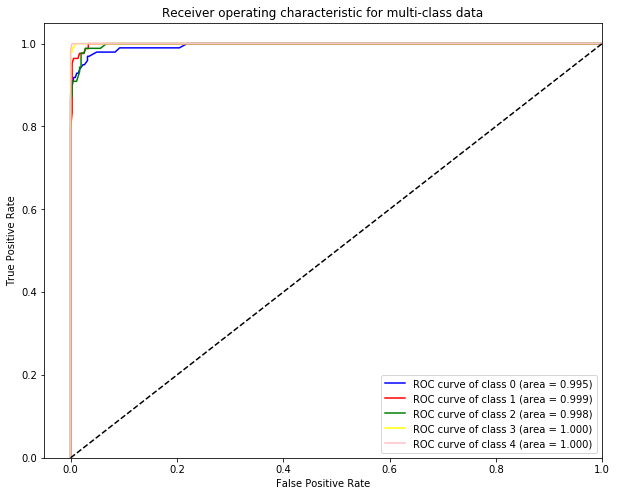

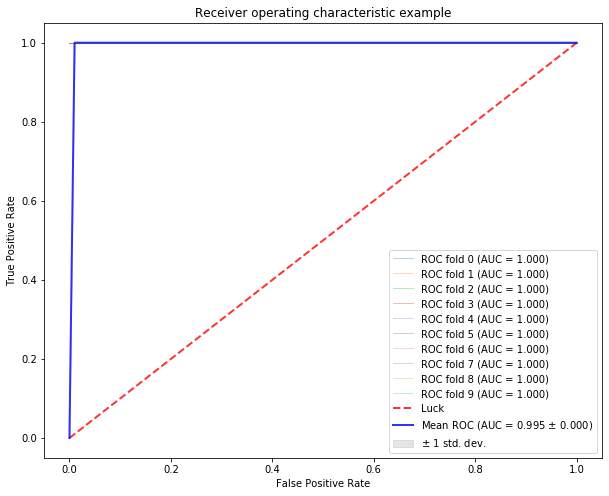

In [14]:
from sklearn.ensemble import RandomForestClassifier

def myRFC(train, test):
    scoring = {'precision_weighted', 'recall_weighted', 'f1_weighted', 'accuracy'}
    
    text_clf = Pipeline([('vect', CountVectorizer()), ('clf', RandomForestClassifier())])
    cv_scores = cross_validate(text_clf, train.Content, train.Category, cv=10, scoring=scoring)
    print('Count')
    print('Precision: ' ,np.mean(cv_scores['test_precision_weighted']).round(3))
    print('Recall: ' ,np.mean(cv_scores['test_recall_weighted']).round(3))
    print('F1: ' ,np.mean(cv_scores['test_f1_weighted']).round(3))
    print('Accuracy: ' ,np.mean(cv_scores['test_accuracy']).round(3))
    text_clf = text_clf.fit(tempTrain.Content, tempTrain.Category)
    count_predictions = text_clf.predict(test.Content)

    makeROCplot(text_clf, train.Content, train.Category, test.Content, test.Category, count_predictions)
    makeAverageRocPlot(text_clf, train.Content, train.Category)


    text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', RandomForestClassifier())])
    cv_scores = cross_validate(text_clf, train.Content, train.Category, cv=10, scoring=scoring)
    print('Tfidf')
    print('Precision: ' ,np.mean(cv_scores['test_precision_weighted']).round(3))
    print('Recall: ' ,np.mean(cv_scores['test_recall_weighted']).round(3))
    print('F1: ' ,np.mean(cv_scores['test_f1_weighted']).round(3))
    print('Accuracy: ' ,np.mean(cv_scores['test_accuracy']).round(3))
    text_clf = text_clf.fit(tempTrain.Content, tempTrain.Category)
    tfidif_predictions = text_clf.predict(test.Content)

    makeROCplot(text_clf, train.Content, train.Category, test.Content, test.Category, tfidif_predictions)
    makeAverageRocPlot(text_clf, train.Content, train.Category)

    

myRFC(tempTrain, tempTest)

### KNN
Συνάρτηση για K neartest neighbour classification from scratch. Χωρίς κάποια αξιολόγηση πέρα από απλή σύγκριση αποτελεσμάτων.

In [15]:
from sklearn.metrics.pairwise import euclidean_distances

# counts the number of categories for each row and picks the most frequent one
def majorityVoting(K, Y, train):
    predicted = list()
    for row in Y:
        indexes = list()
        for k in range(K):
            j = np.argmin(row)
            row[j] = float("inf")
            indexes.append(j)

        candidates = list()
        for id in indexes:
            candidates.append(train.Category[id])
        predicted.append(max(set(candidates), key = candidates.count))
    return np.mean(predicted == tempTest.Category).round(3)

def myKNN(K, train, test):
    tempComb = train
    tempComb = tempComb.append(test)
    
    #get the count verctorizer matrix
    count_vect = CountVectorizer()
    X = count_vect.fit_transform(tempComb.Content)
    
    #calculate distances between the articles
    Y = euclidean_distances(X,X)
    #keep the part of the matrix where the dimensions are test x train
    Y = Y[len(train): , :len(train)]
    
    #for every test article assign category
    count_prec = majorityVoting(K, Y, train)

    #repeat for tfidf matrix
    tfidf_vect = TfidfVectorizer()
    X = tfidf_vect.fit_transform(tempComb.Content)
     
    Y = euclidean_distances(X,X)
    Y = Y[len(train): , :len(train)]

    tfidf_prec = majorityVoting(K, Y, train)

    return {"count":count_prec, "tfidf":tfidf_prec}

result = myKNN(3 ,tempTrain, tempTest)
result

{'count': 0.735, 'tfidf': 0.901}

## Ερώτημα 4

Υλοποίηση clustering για count, tfidf και word2 vectorizers με βάση cosine distance. Συγχώνευση των δεδομένων με την χρήση pca και εκτύπωση των scatterplots για κάθε vectorizer.

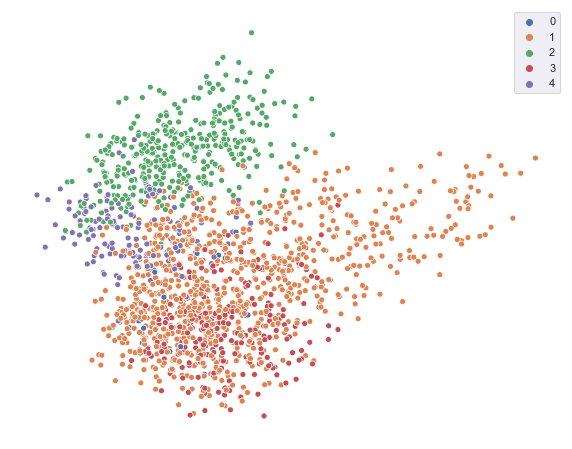

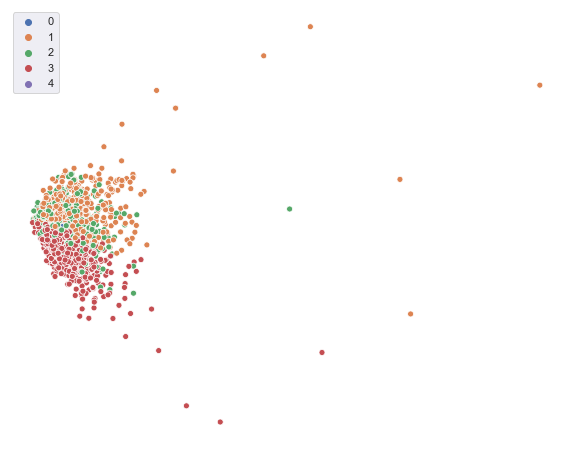

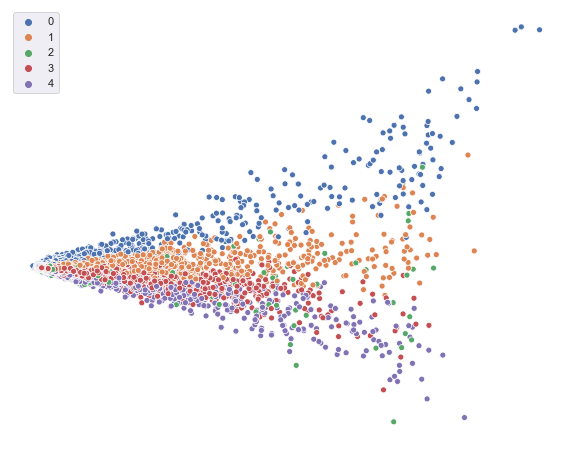

In [16]:
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from nltk.cluster import KMeansClusterer, cosine_distance
from gensim.models import Word2Vec
import seaborn as sns
sns.set()

train = tempTrain['Content']

#################### tfidf

tfidf_vect = TfidfVectorizer()
X = tfidf_vect.fit_transform(train)
X = X.toarray()

clusterer = KMeansClusterer(5, cosine_distance)
x_kmeans = clusterer.cluster(X, True)

pca = PCA(n_components=2)
pca.fit(X)
scores_pca_x = pca.transform(X)
res_x = pd.DataFrame(scores_pca_x)

##################### count vect

Y = CountVectorizer()
Y = Y.fit_transform(train)
Y = Y.toarray()

clusterer = KMeansClusterer(5, cosine_distance)
y_kmeans = clusterer.cluster(Y, True)

pca = PCA(n_components=2)
pca.fit(Y)
scores_pca_y = pca.transform(Y)
res_y = pd.DataFrame(scores_pca_y)

#################### word2vec

wordies = []
for i in range(len(train)):
    wordies.append([])
    temp = train[i].split()
    wordies[i] = temp
    del temp

model = Word2Vec(wordies, min_count=1)

Z = model[model.wv.vocab]  

clusterer = KMeansClusterer(5, cosine_distance)
z_kmeans = clusterer.cluster(Z, True)

pca = PCA(n_components=2)
pca.fit(Z)
scores_pca_z = pca.transform(Z)
res_z = pd.DataFrame(scores_pca_z)

#################### plots

plt.figure(figsize = (10,8))
sns.scatterplot(res_x[0], res_x[1], hue = x_kmeans, palette=sns.color_palette(n_colors=5))
plt.axis('off')
plt.show()

plt.figure(figsize = (10,8))
sns.scatterplot(res_y[0], res_y[1], hue = y_kmeans, palette=sns.color_palette(n_colors=5))
plt.axis('off')
plt.show()

plt.figure(figsize = (10,8))
sns.scatterplot(res_z[0], res_z[1], hue = z_kmeans, palette=sns.color_palette(n_colors=5))
plt.axis('off')
plt.show()